# Mini Project: Solving inverse problems with denoising priors.

## Yan Liu and Zhiyuan Hu, EPFL

In this mini project, you will compare different Plug-and-Play (PnP) and diffusion-based iterative image restoration algorithms. These methods make use of image denoisers as regularization priors. These algorithms will be applied for image deblurring. In particular, you will compare standard PnP versus diffusion models, and implement a new algorithm based on diffusion models.

In [ ]:
%%capture
pip install git+https://github.com/deepinv/deepinv.git#egg=deepinv

In [2]:
import torch
import deepinv as dinv
from torchvision import transforms
from deepinv.utils.demo import load_dataset, load_degradation

In [3]:
device = dinv.utils.get_freer_gpu() if torch.cuda.is_available() else "cpu"

Selected GPU 0 with 32491 MiB free memory 


### Bencharmarking PnP and diffusion models for image deblurring

The goal of this section is to identify and compare the performance of PnP and diffusion-based iterative algorithms. We will work on images blurred with mild and severe blurs.

You will use as test dataset the 10 first images of the CBSD68 dataset.

In [4]:
dataset_name = 'CBSD68'
img_size = 128
num_images = 10
val_transform = transforms.Compose([transforms.CenterCrop(img_size), transforms.ToTensor()])
dataset = load_dataset(dataset_name, transform=val_transform)
eval_images = [dataset[i][0].to(device) for i in range(num_images)]
eval_images = torch.stack(eval_images, dim=0)
eval_images.shape

torch.Size([10, 3, 128, 128])

Compare the performance between different PnP algorithms and diffusion-based algorithms for solving a deblurring problem.

- **Hint 1** You can explore different denoisers with different architecture size.
- **Hint 2** For PnP, you can try different optimization algorithms for integrating the PnP prior. Try different parameters (stepsize, denoising noise level ...) for optimal performance.
- **Hint 3** For using diffusion models, you can refer to the different demos from the documentation (`demo_ddrm.py`, `demo_diffpir.py`, `demo_diffusion_sde.py`) and compare several algorithms. It might be necessary to play with the corresponding hyperparameters. Check on which dataset / image size each denoiser has been trained. For example :

In [5]:
denoiser = dinv.models.DRUNet(pretrained="download")

In [6]:
denoiser = dinv.models.DiffUNet()

In [7]:
denoiser = dinv.models.NCSNpp(pretrained="download").to(device)

The algorithms will be evaluated on mild and strong. For example:

##### Mild degradation

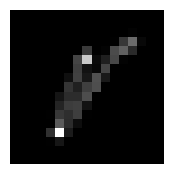

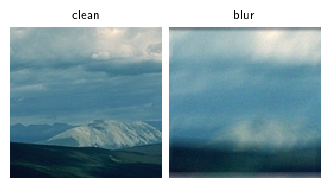

In [21]:
kernel = load_degradation("Levin09.npy",  "kernels", index=1).unsqueeze(0).unsqueeze(0)
dinv.utils.plot(kernel)

sigma_noise = 0.01
noise_model = dinv.physics.GaussianNoise(sigma = sigma_noise)

physics = dinv.physics.BlurFFT(filter = kernel, img_size=eval_images[0].shape, noise_model = noise_model, device = device)
blur_images = physics(eval_images)

idx = 2
dinv.utils.plot([eval_images[idx], blur_images[idx]], titles = ['clean', 'blur'])

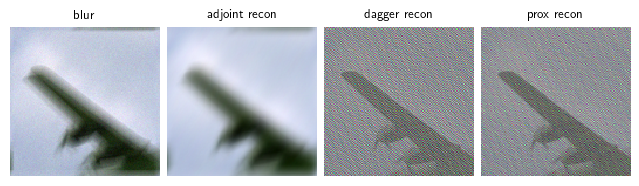

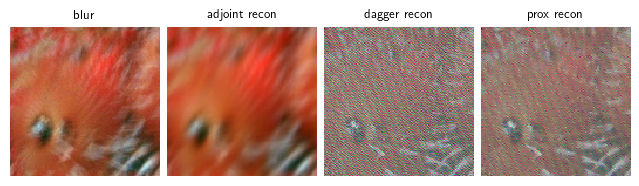

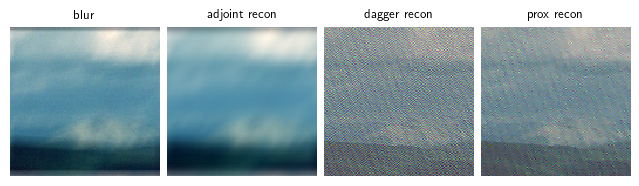

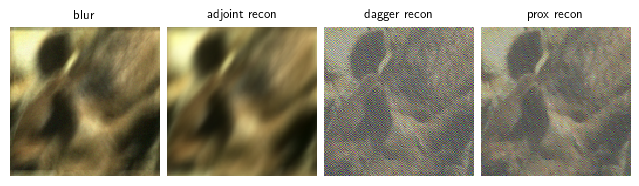

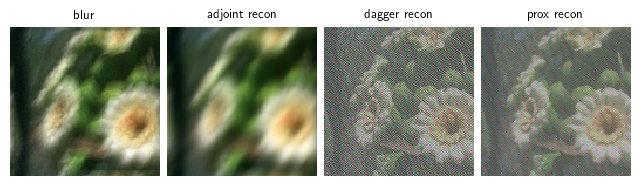

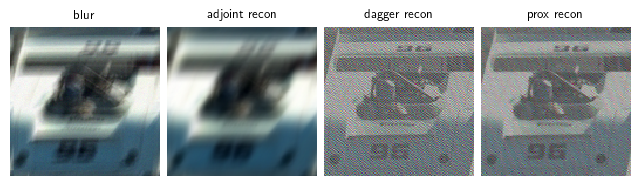

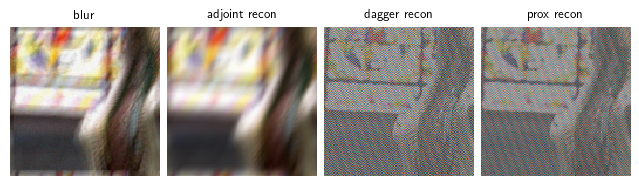

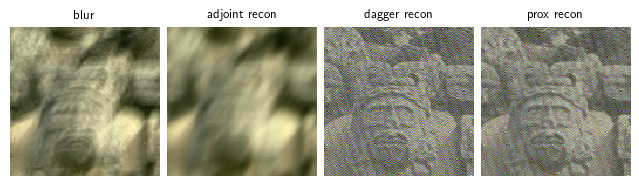

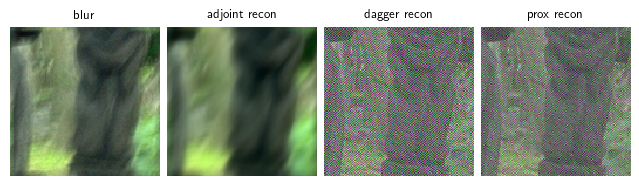

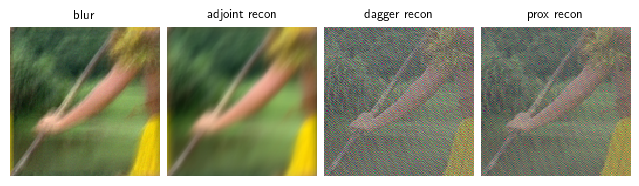

In [22]:
# * linear reconstruction not so good
adjoint_recons = physics.A_adjoint(blur_images)
dagger_recons = physics.A_dagger(blur_images)
prox_recons = dinv.optim.prior.TVPrior().prox(dagger_recons, blur_images, physics, gamma=0.1)

idx = 0
for i in range(eval_images.shape[0]):
    dinv.utils.plot([
        blur_images[i],
        adjoint_recons[i],
        dagger_recons[i],
        prox_recons[i]
    ], titles = ['blur', 'adjoint recon', 'dagger recon', 'prox recon'])

In [55]:
max_iter = 80
stepsize = 1.
sigma_denoiser = 0.01
params_algo = {
    "stepsize": stepsize,
    "g_param": sigma_denoiser,
}

data_fidelity = dinv.optim.data_fidelity.L2(sigma=1.)
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.DiffUNet().to(device))
prior = dinv.optim.prior.PnP(denoiser=dinv.models.DRUNet().to(device))
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.NCSNpp().to(device))

In [57]:
def custom_init(y, physics):
    # return {"est": (data_fidelity.prox(physics.A_adjoint(y), y, physics), data_fidelity.prox(physics.A_adjoint(y), y, physics))}
    return {"est": (physics.A_adjoint(y), physics.A_adjoint(y))}

In [58]:
model_pnp = dinv.optim.optim_builder(
    iteration='PGD',
    data_fidelity=data_fidelity,
    prior=prior,
    max_iter=max_iter,
    params_algo=params_algo,
    custom_init=custom_init,
)

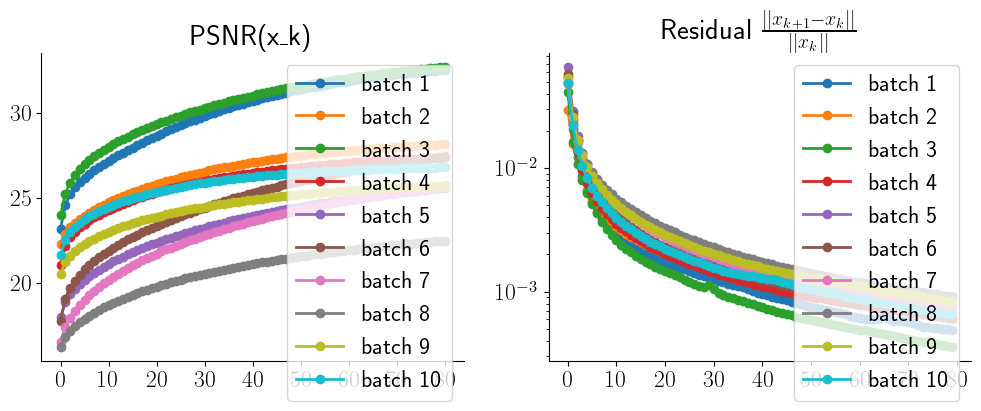

In [40]:
with torch.no_grad():
    recon_images, metrics = model(
        blur_images, physics, x_gt=eval_images, compute_metrics=True
    )

# print(f"PnP reconstruction PSNR: {dinv.metric.PSNR()(eval_images[idx], recon_images[idx]).item():.2f} dB")
# print(f"PnP reconstruction SSIM: {dinv.metric.SSIM()(eval_images[idx], recon_images[idx]).item():.2f}")
# plot images. Images are saved in RESULTS_DIR.

plot_convergence_metrics = True

if plot_convergence_metrics:
    dinv.utils.plot_curves(metrics, show=True)

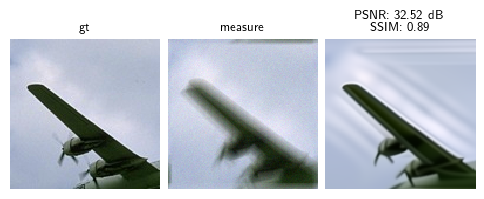

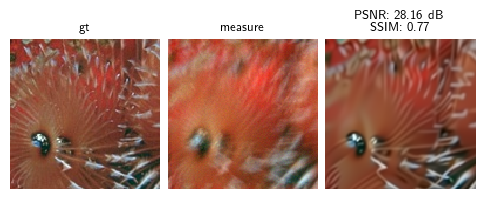

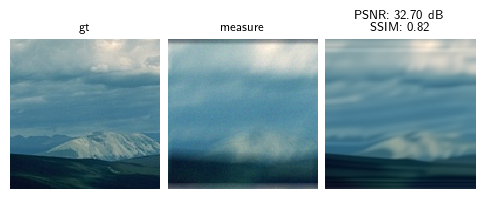

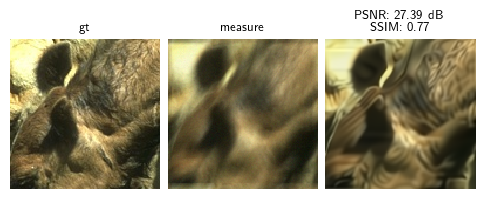

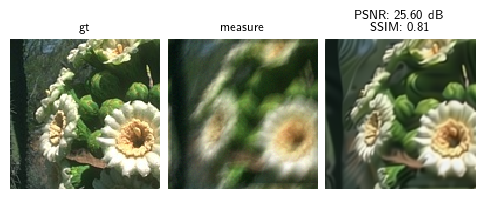

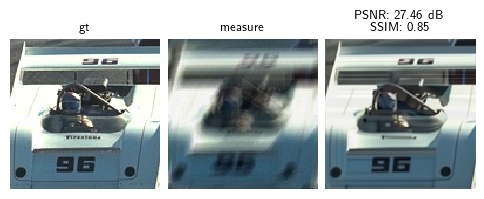

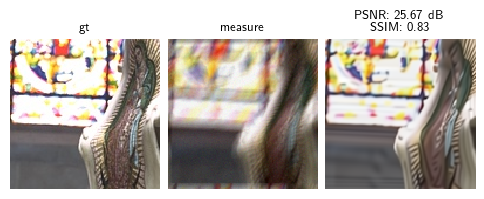

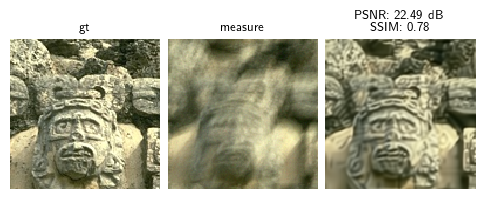

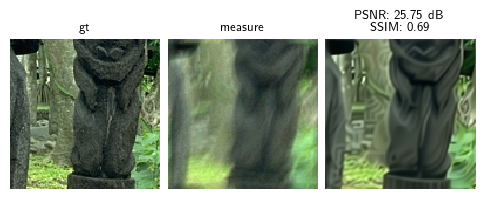

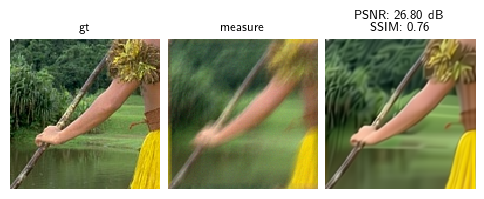

In [41]:
for i in range(10):
    dinv.utils.plot(
        [eval_images[i], blur_images[i], recon_images[i]],
        titles=["gt", "measure", f"PSNR: {dinv.metric.PSNR()(eval_images[i].unsqueeze(0), recon_images[i].unsqueeze(0)).item():.2f} dB \n SSIM: {dinv.metric.SSIM()(eval_images[i].unsqueeze(0), recon_images[i].unsqueeze(0)).item():.2f}"],
        show=True,
        figsize=(6, 2),
    )

##### Strong degadations

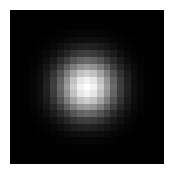

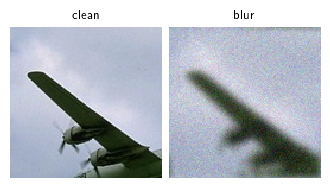

In [8]:
kernel = dinv.physics.blur.gaussian_blur(sigma=(3, 3))
dinv.utils.plot(kernel)

sigma_noise = 0.03
noise_model = dinv.physics.GaussianNoise(sigma = sigma_noise)

physics = dinv.physics.BlurFFT(filter = kernel, img_size=eval_images[0].shape, noise_model = noise_model, device = device)
blur_images = physics(eval_images)

dinv.utils.plot([eval_images[0], blur_images[0]], titles = ['clean', 'blur'])

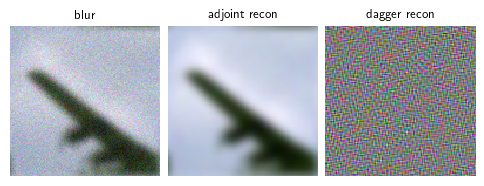

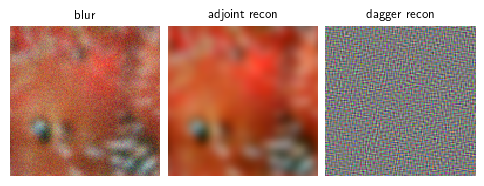

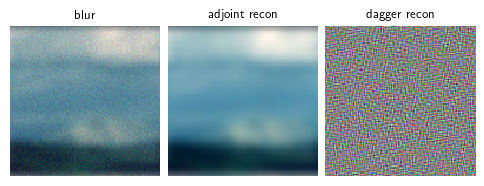

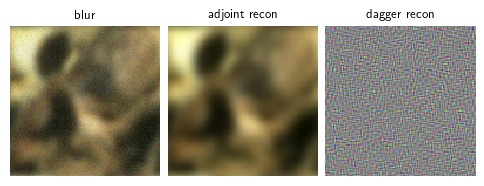

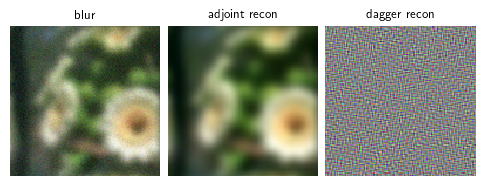

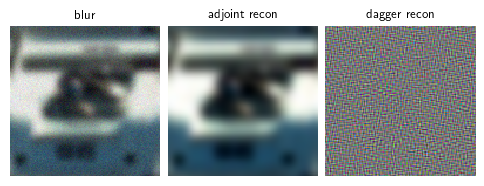

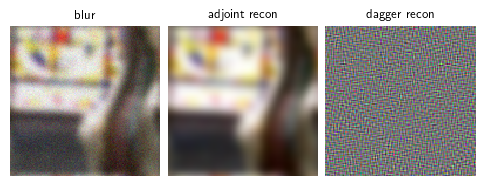

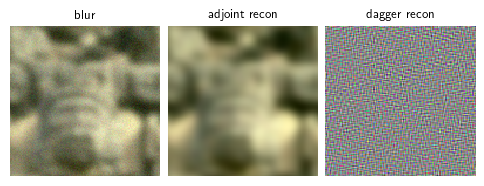

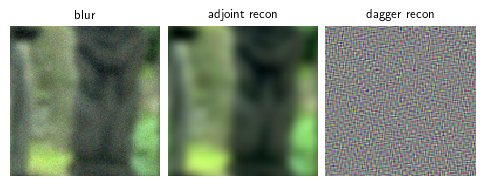

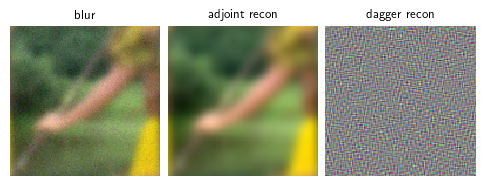

In [9]:
# * linear reconstruction not so good
adjoint_recons = physics.A_adjoint(blur_images)
dagger_recons = physics.A_dagger(blur_images)

idx = 0
for i in range(eval_images.shape[0]):
    dinv.utils.plot([blur_images[i], adjoint_recons[i], dagger_recons[i]], titles = ['blur', 'adjoint recon', 'dagger recon'])

In [54]:
max_iter = 80
stepsize = 1.
sigma_denoiser = 0.01
params_algo = {
    "stepsize": stepsize,
    "g_param": sigma_denoiser,
}

data_fidelity = dinv.optim.data_fidelity.L2(sigma=1.)
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.DiffUNet().to(device))
prior = dinv.optim.prior.PnP(denoiser=dinv.models.DRUNet().to(device))
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.NCSNpp().to(device))

In [55]:
def custom_init(y, physics):
    # return {"est": (data_fidelity.prox(physics.A_adjoint(y), y, physics), data_fidelity.prox(physics.A_adjoint(y), y, physics))}
    return {"est": (physics.A_adjoint(y), physics.A_adjoint(y))}

In [56]:
model = dinv.optim.optim_builder(
    iteration='PGD',
    data_fidelity=data_fidelity,
    prior=prior,
    max_iter=max_iter,
    params_algo=params_algo,
    custom_init=custom_init,
)

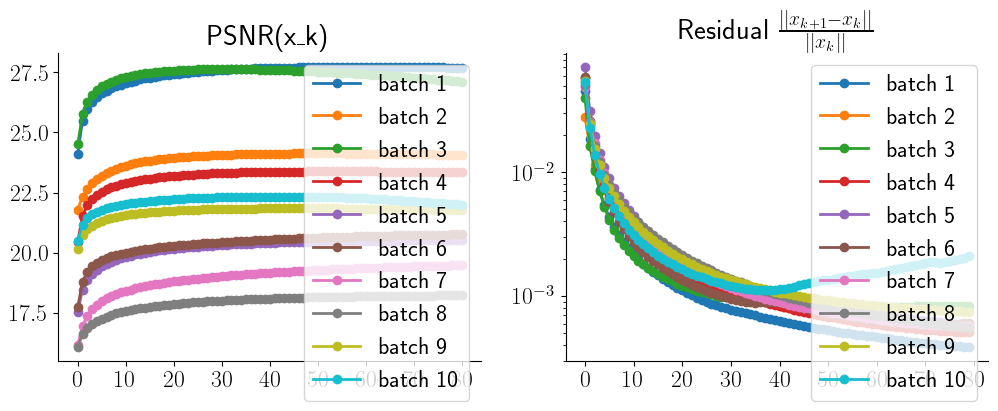

In [57]:
with torch.no_grad():
    recon_images, metrics = model(
        blur_images, physics, x_gt=eval_images, compute_metrics=True
    )

# print(f"PnP reconstruction PSNR: {dinv.metric.PSNR()(eval_images[idx], recon_images[idx]).item():.2f} dB")
# print(f"PnP reconstruction SSIM: {dinv.metric.SSIM()(eval_images[idx], recon_images[idx]).item():.2f}")
# plot images. Images are saved in RESULTS_DIR.

plot_convergence_metrics = True

if plot_convergence_metrics:
    dinv.utils.plot_curves(metrics, show=True)

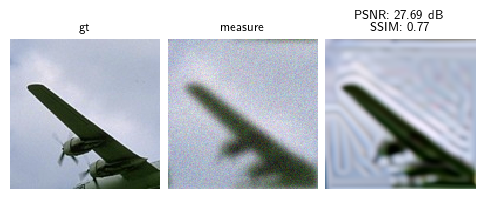

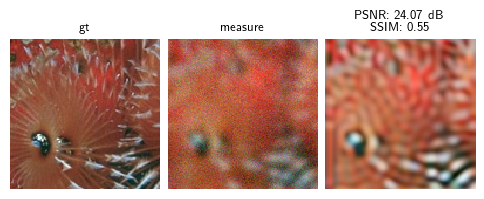

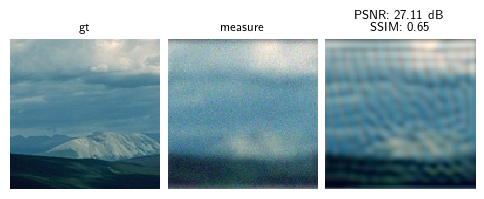

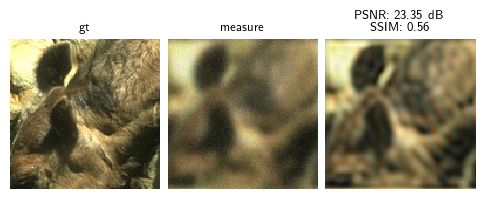

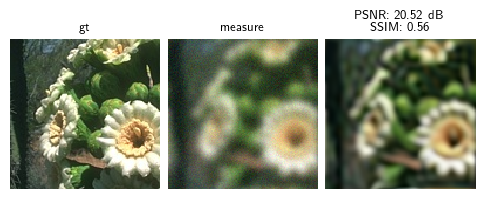

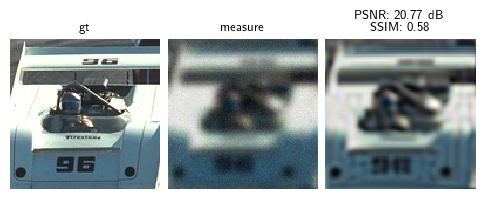

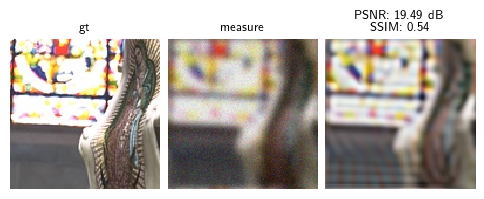

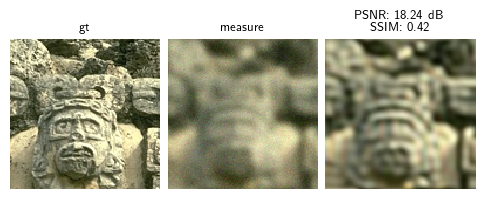

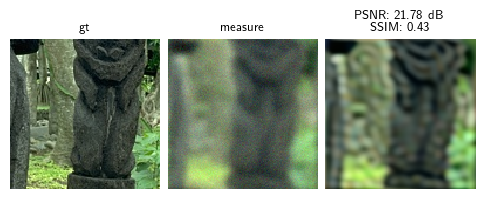

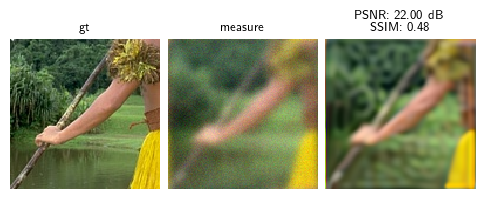

In [58]:
for i in range(10):
    dinv.utils.plot(
        [eval_images[i], blur_images[i], recon_images[i]],
        titles=["gt", "measure", f"PSNR: {dinv.metric.PSNR()(eval_images[i].unsqueeze(0), recon_images[i].unsqueeze(0)).item():.2f} dB \n SSIM: {dinv.metric.SSIM()(eval_images[i].unsqueeze(0), recon_images[i].unsqueeze(0)).item():.2f}"],
        show=True,
        figsize=(6, 2),
    )

### Going further with diffusion models

In the demo [`demo_diffusion_sde.py`](https://deepinv.github.io/deepinv/auto_examples/sampling/demo_diffusion_sde.html), we experience with the DPS sampling algorithm, implemented via the DPS version of a `NoisyDataFidelity` (refer to the demo for more details). We also choose the variance exploding diffusion, discretized with the Euler solver.

- First, you can explore on the deblurring problem different diffusion algorithms (Variance Preserving, Variance Exploding ...) and discretization methods (Euler, Heun).
- Second, you can implement a different  `NoisyDataFidelity` terms for approximating the untractable $\log p(y|x_t)$.  `https://arxiv.org/pdf/2410.00083` (Figure 1) provides a survey of different approximations. For example, you can try to implement the Score-SDE, ILRV or PiGDM methods.





In [10]:
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float64
figsize = 2.5
gif_frequency = 10  # Increase this value to save the GIF saving time

In [ ]:
from deepinv.sampling import (
    PosteriorDiffusion,
    DPSDataFidelity,
    EulerSolver,
    HeunSolver,
    VarianceExplodingDiffusion,
    VariancePreservingDiffusion,
)
from deepinv.optim import ZeroFidelity

# In this example, we use the pre-trained FFHQ-64 model from the
# EDM framework: https://arxiv.org/pdf/2206.00364 .
# The network architecture is from Song et al: https://arxiv.org/abs/2011.13456 .
denoiser = dinv.models.NCSNpp(pretrained="download").to(device)
# denoiser = dinv.models.DiffUNet(pretrained="download").to(device)

# The solution is obtained by calling the SDE object with a desired solver (here, Euler).
# The reproducibility of the SDE Solver class can be controlled by providing the pseudo-random number generator.
num_steps = 150
rng = torch.Generator(device).manual_seed(42)
timesteps = torch.linspace(1, 0.001, num_steps)
solver = EulerSolver(timesteps=timesteps, rng=rng)
# solver = HeunSolver(timesteps=timesteps, rng=rng)


sigma_min = 0.005
sigma_max = 5
sde = VariancePreservingDiffusion( # VarianceExploding works worse
    # sigma_max=sigma_max,
    # sigma_min=sigma_min,
    alpha=0.5,
    device=device,
    dtype=dtype,
)

In [36]:
weight = 1.0  # guidance strength
dps_fidelity = DPSDataFidelity(denoiser=denoiser, weight=weight)

100%|██████████| 149/149 [01:49<00:00,  1.36it/s]


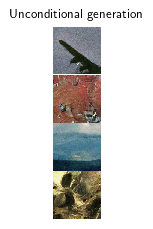

In [37]:
model = PosteriorDiffusion(
    data_fidelity=dps_fidelity,
    sde=sde,
    denoiser=denoiser,
    solver=solver,
    dtype=dtype,
    device=device,
    verbose=True,
)
diffusion_images, trajectory = model(
    y=blur_images,
    physics=physics,
    x_init=(10, 3, 128, 128),
    seed=1,
    get_trajectory=True,
)
dinv.utils.plot(
    diffusion_images.cpu(),
    titles="Unconditional generation",
    save_fn="sde_sample.png",
    figsize=(figsize, figsize),
)

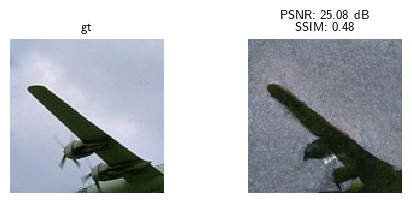

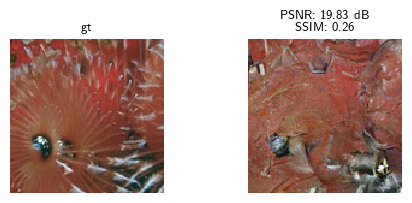

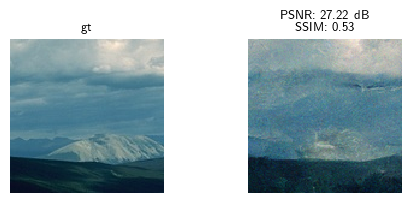

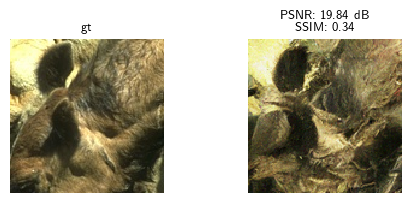

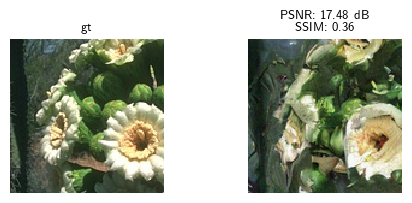

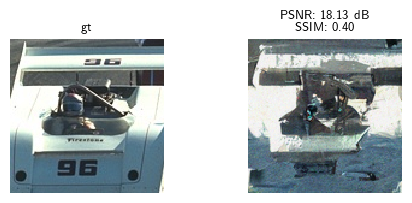

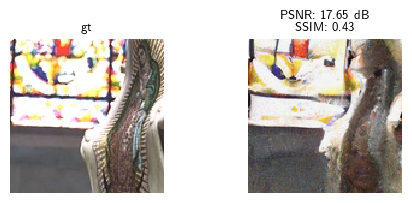

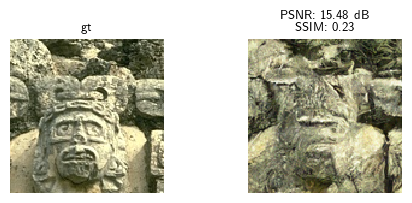

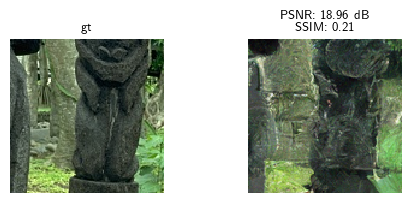

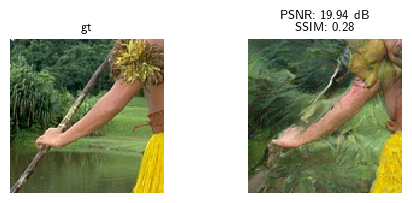

In [38]:
for i in range(10):
    dinv.utils.plot(
        [eval_images[i], diffusion_images[i].cpu()],
        titles=["gt", f"PSNR: {dinv.metric.PSNR()(eval_images[i].unsqueeze(0), diffusion_images[i].unsqueeze(0)).item():.2f} dB \n SSIM: {dinv.metric.SSIM()(eval_images[i].unsqueeze(0), diffusion_images[i].unsqueeze(0)).item():.2f}"],
        show=True,
        figsize=(6, 2),
    )

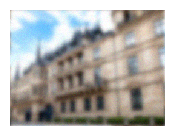

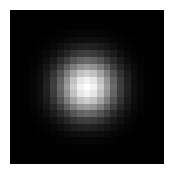

torch.Size([1, 3, 192, 256])

In [65]:
y_gaussian = dinv.utils.load_example('y_gaussian.png').to(device)
dinv.utils.plot(y_gaussian)
kernel1 = dinv.physics.blur.gaussian_blur(sigma=(3, 3))
dinv.utils.plot(kernel1)
y_gaussian.shape

In [71]:
physics_1 = dinv.physics.Blur(filter=kernel1, device=device, noise_model=dinv.physics.GaussianNoise(sigma = 0.02), padding='replicate')
physics_1.A_adjoint(y_gaussian).shape

torch.Size([1, 3, 192, 256])

In [72]:
max_iter = 80
stepsize = 1.
sigma_denoiser = 0.01
params_algo = {
    "stepsize": stepsize,
    "g_param": sigma_denoiser,
}

data_fidelity = dinv.optim.data_fidelity.L2(sigma=1.)
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.DiffUNet().to(device))
prior = dinv.optim.prior.PnP(denoiser=dinv.models.DRUNet().to(device))
# prior = dinv.optim.prior.PnP(denoiser=dinv.models.NCSNpp().to(device))

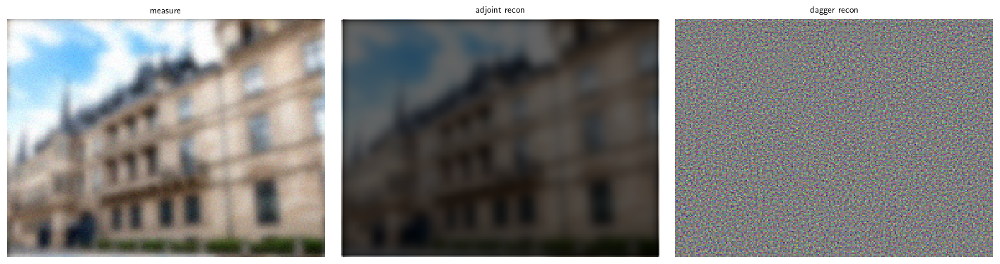

In [73]:
dinv.utils.plot([y_gaussian, physics_1.A_adjoint(y_gaussian), physics_1.A_dagger(y_gaussian)], titles=['measure', 'adjoint recon', 'dagger recon'], figsize=(18, 6))

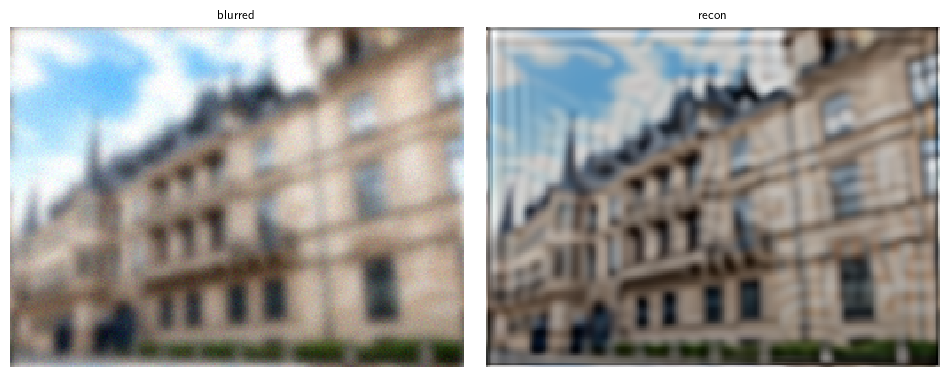

In [74]:
with torch.no_grad():
    x_pnp, metrics = model_pnp(
        y_gaussian, physics_1, compute_metrics=True
    )

dinv.utils.plot(
    [y_gaussian, x_pnp],
    titles=["blurred", "recon"],
    show=True,
    figsize=(12, 6),
)

In [75]:
diffusion_images, trajectory = model(
    y=y_gaussian,
    physics=physics_1,
    x_init=(1, 3, 192, 256),
    seed=1,
    get_trajectory=True,
)

  0%|          | 0/149 [00:00<?, ?it/s]

100%|██████████| 149/149 [00:32<00:00,  4.61it/s]


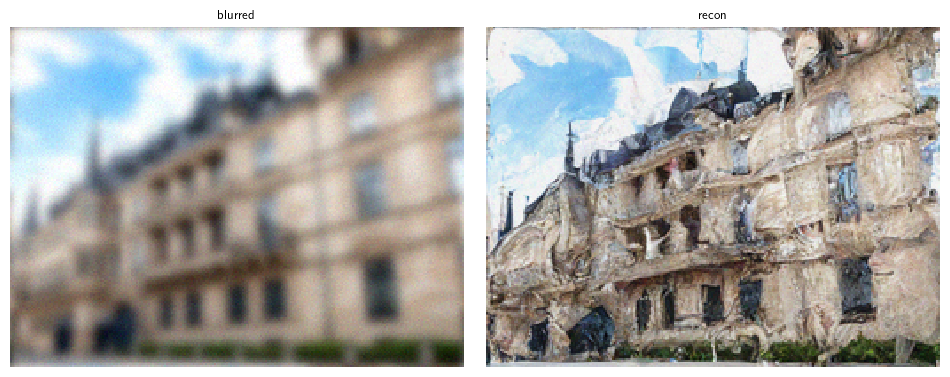

In [76]:
dinv.utils.plot(
    [y_gaussian, diffusion_images],
    titles=["blurred", "recon"],
    show=True,
    figsize=(12, 6),
)

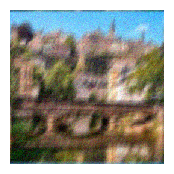

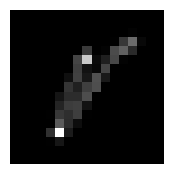

In [85]:
y_motion = dinv.utils.load_example('y_motion.png').to(device).to(torch.float32)
dinv.utils.plot(y_motion)
kernel2 = load_degradation("Levin09.npy",  "kernels", index=1).unsqueeze(0).unsqueeze(0).to(device).to(torch.float32)
dinv.utils.plot(kernel2)

In [86]:
physics_2 = dinv.physics.Blur(filter=kernel2, device=device, noise_model=dinv.physics.GaussianNoise(sigma = 0.05), padding='replicate')
physics_2.A_adjoint(y_motion).shape

torch.Size([1, 3, 256, 256])

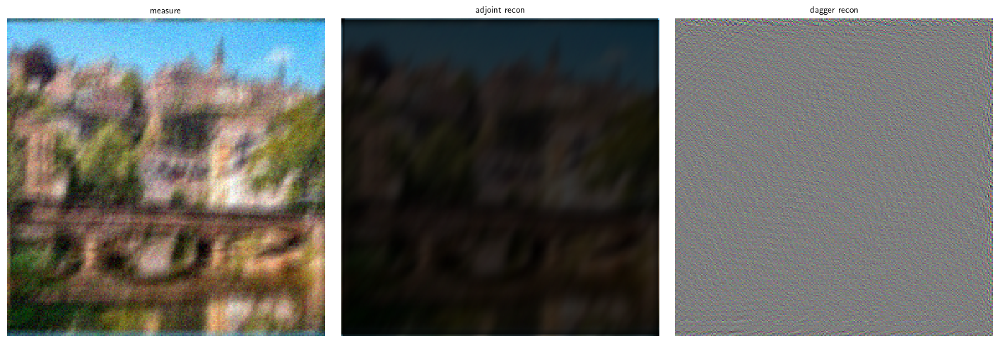

In [90]:
dinv.utils.plot([y_motion, physics_2.A_adjoint(y_motion), physics_2.A_dagger(y_motion)], titles=['measure', 'adjoint recon', 'dagger recon'], figsize=(18, 6))

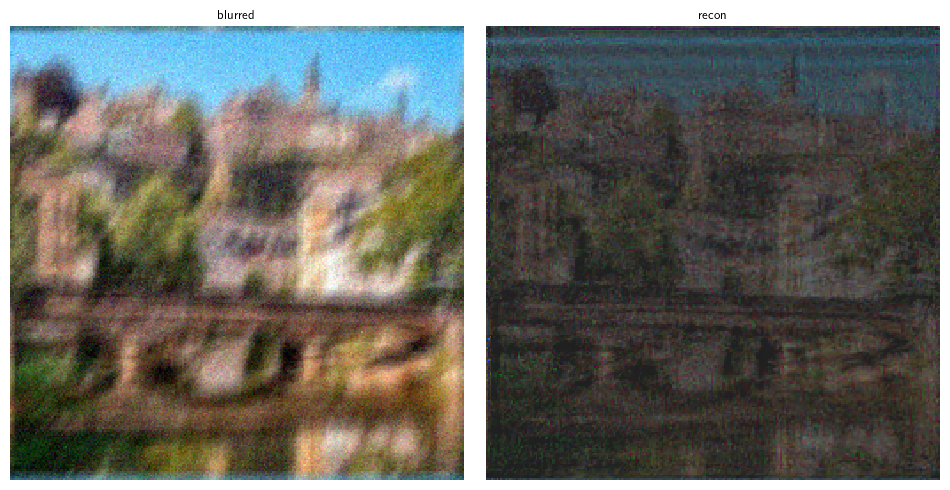

In [87]:
with torch.no_grad():
    x_pnp_2, metrics = model_pnp(
        y_motion, physics_2, compute_metrics=True
    )

dinv.utils.plot(
    [y_motion, x_pnp_2],
    titles=["blurred", "recon"],
    show=True,
    figsize=(12, 6),
)

In [88]:
x_diffusion, trajectory = model(
    y=y_motion,
    physics=physics_2,
    x_init=(1, 3, 256, 256),
    seed=1,
    get_trajectory=True,
)

100%|██████████| 149/149 [00:43<00:00,  3.42it/s]


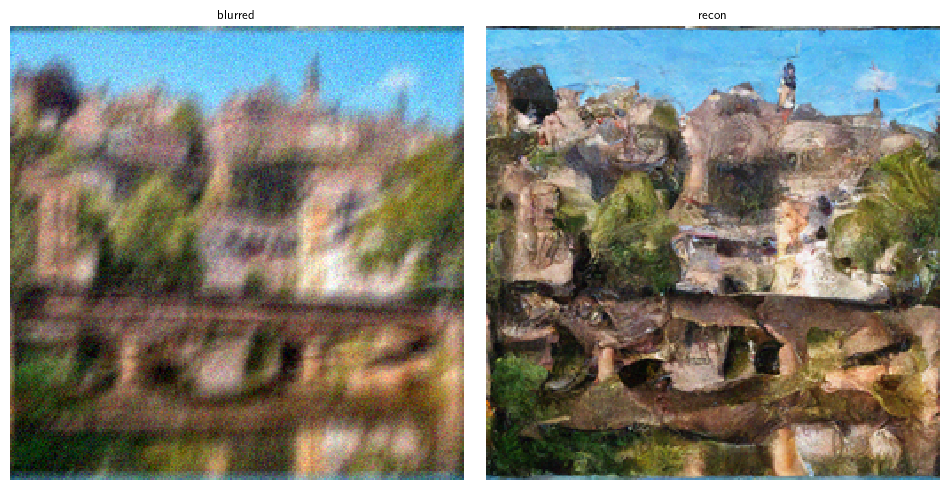

In [89]:
dinv.utils.plot(
    [y_motion, x_diffusion],
    titles=["blurred", "recon"],
    show=True,
    figsize=(12, 6),
)